<a href="https://colab.research.google.com/github/saugata-malakar/ML-CaPsule/blob/master/Breast_Cancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# prompt: import all ml libratries

# Standard ML Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning Models
# Linear Models
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso, ElasticNet
# Tree Models
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
# Ensemble Models
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor, AdaBoostClassifier, AdaBoostRegressor
# SVM
from sklearn.svm import SVC, SVR
# Naive Bayes
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
# KNN
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
# Neural Networks
from sklearn.neural_network import MLPClassifier, MLPRegressor

# Clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Dimensionality Reduction
from sklearn.decomposition import PCA, FactorAnalysis, TruncatedSVD

# Model Selection and Evaluation
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, mean_squared_error, r2_score

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder, PolynomialFeatures

# Pipelines
from sklearn.pipeline import Pipeline

# Other useful libraries
import scipy.stats as stats
import statsmodels.api as sm

In [2]:
df=pd.read_csv('/content/data (2).csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/data (2).csv')

# Display the first 5 rows
print(df.head())

# Get basic information about the dataset
print(df.info())

# Check for missing values
print(df.isnull().sum())

# Get summary statistics
print(df.describe())


         id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0    842302         M        17.99         10.38          122.80     1001.0   
1    842517         M        20.57         17.77          132.90     1326.0   
2  84300903         M        19.69         21.25          130.00     1203.0   
3  84348301         M        11.42         20.38           77.58      386.1   
4  84358402         M        20.29         14.34          135.10     1297.0   

   smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0          0.11840           0.27760          0.3001              0.14710   
1          0.08474           0.07864          0.0869              0.07017   
2          0.10960           0.15990          0.1974              0.12790   
3          0.14250           0.28390          0.2414              0.10520   
4          0.10030           0.13280          0.1980              0.10430   

   ...  texture_worst  perimeter_worst  area_worst  smoothness

diagnosis
B    357
M    212
Name: count, dtype: int64


<ipython-input-6-ffa5b06766ef>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='diagnosis', palette='pastel')


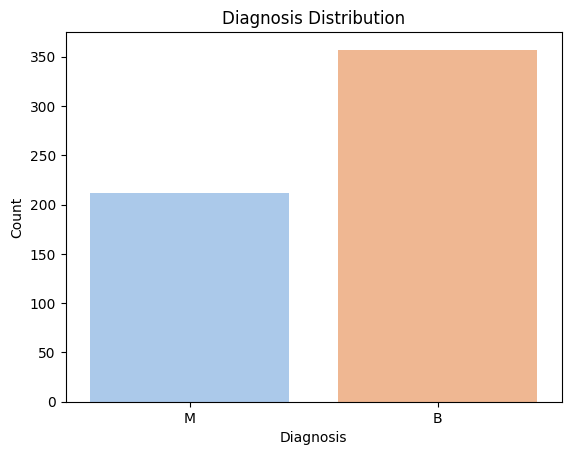

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Check class distribution (assuming the target column is 'diagnosis' or similar)
print(df['diagnosis'].value_counts())

# Plot target distribution
sns.countplot(data=df, x='diagnosis', palette='pastel')
plt.title("Diagnosis Distribution")
plt.xlabel("Diagnosis")
plt.ylabel("Count")
plt.show()


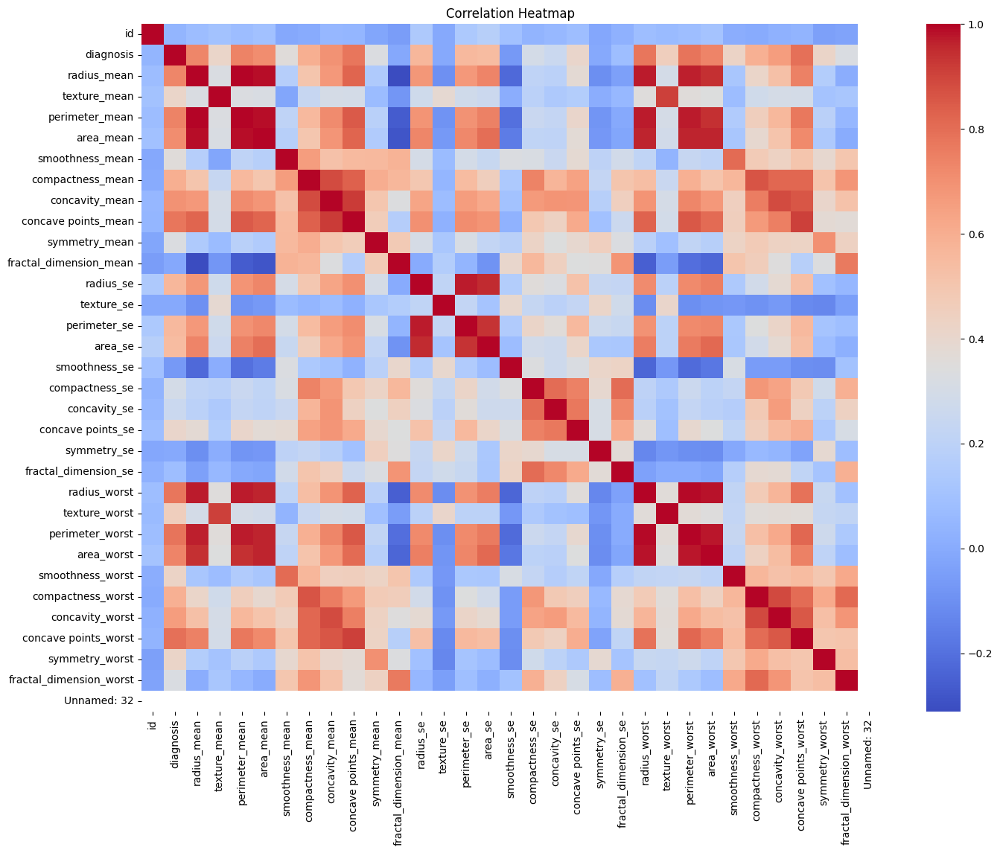

In [7]:
# Convert diagnosis to numeric for correlation
df_encoded = df.copy()
df_encoded['diagnosis'] = df_encoded['diagnosis'].map({'M': 1, 'B': 0})

# Plot correlation matrix
plt.figure(figsize=(16,12))
corr = df_encoded.corr()
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title("Correlation Heatmap")
plt.show()


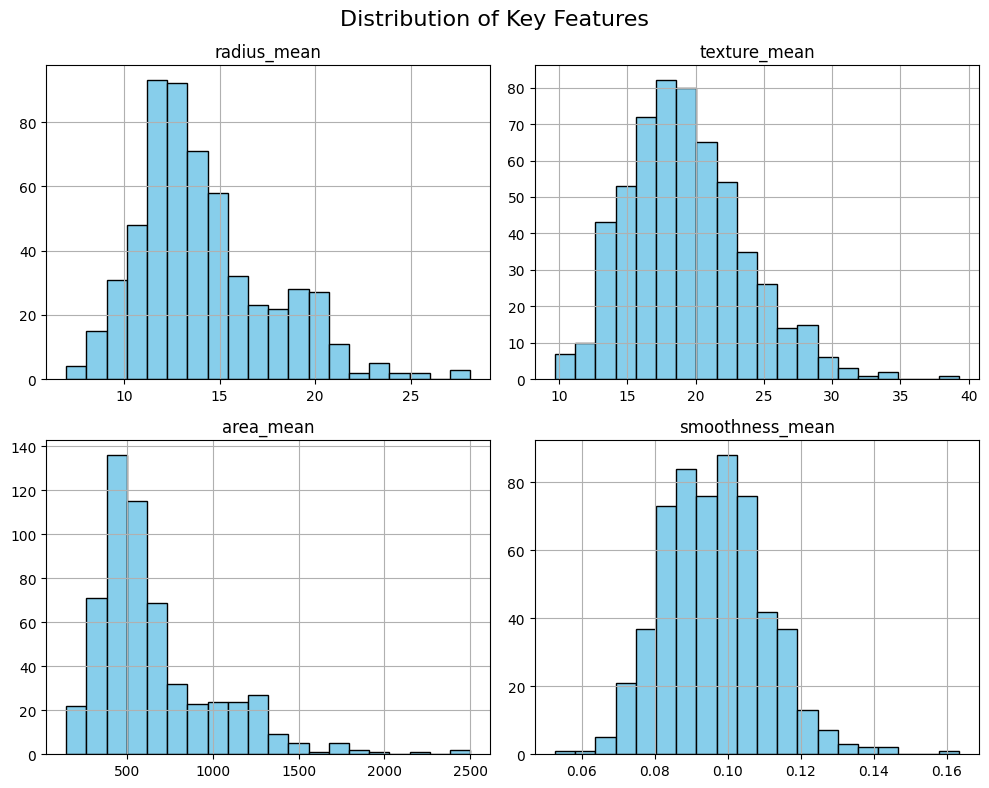

In [8]:
# List of a few important features (adjust depending on dataset)
features = ['radius_mean', 'texture_mean', 'area_mean', 'smoothness_mean']

# Plot histograms
df[features].hist(bins=20, figsize=(10, 8), color='skyblue', edgecolor='black')
plt.suptitle("Distribution of Key Features", fontsize=16)
plt.tight_layout()
plt.show()


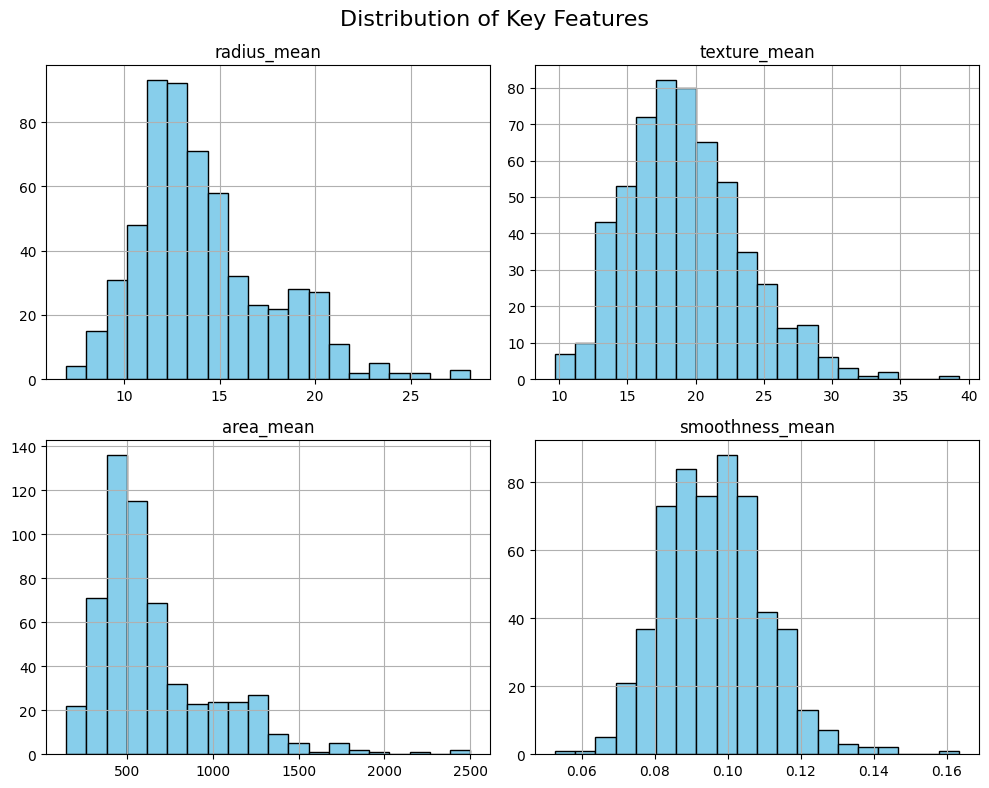

In [9]:
# List of a few important features (adjust depending on dataset)
features = ['radius_mean', 'texture_mean', 'area_mean', 'smoothness_mean']

# Plot histograms
df[features].hist(bins=20, figsize=(10, 8), color='skyblue', edgecolor='black')
plt.suptitle("Distribution of Key Features", fontsize=16)
plt.tight_layout()
plt.show()


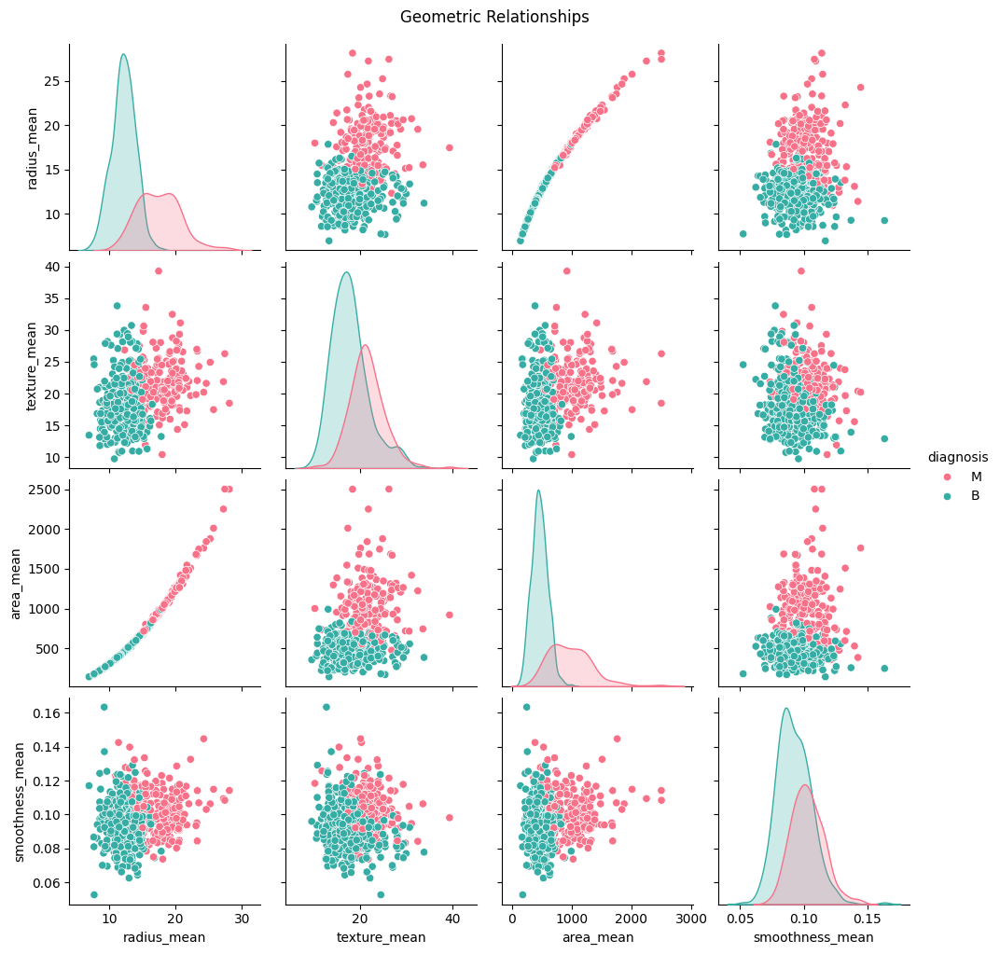

In [10]:
# Pairplot to see relationships between features and diagnosis
sns.pairplot(df, vars=features, hue='diagnosis', palette='husl')
plt.suptitle("Geometric Relationships", y=1.02)
plt.show()


In [11]:
# Create separate dataframes
malignant = df[df['diagnosis'] == 'M']
benign = df[df['diagnosis'] == 'B']

# Preview counts
print("Malignant cases:", malignant.shape[0])
print("Benign cases:", benign.shape[0])


Malignant cases: 212
Benign cases: 357


<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


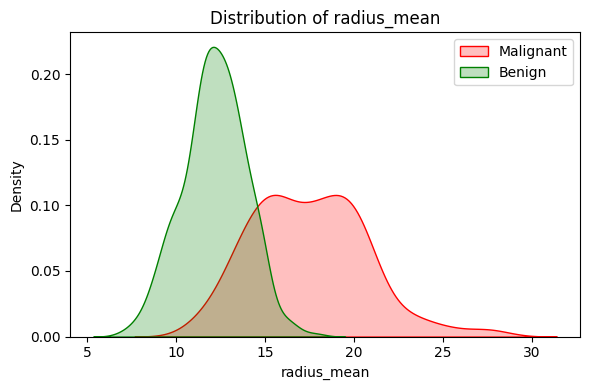

<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


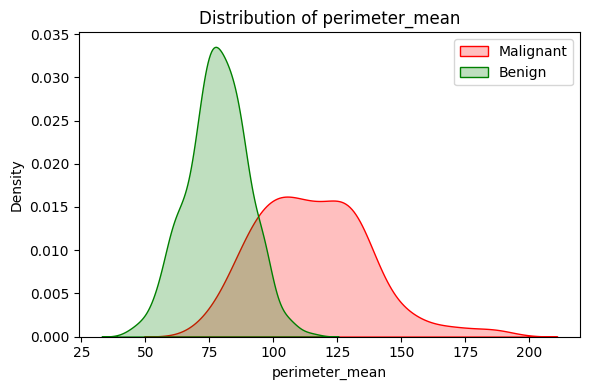

<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


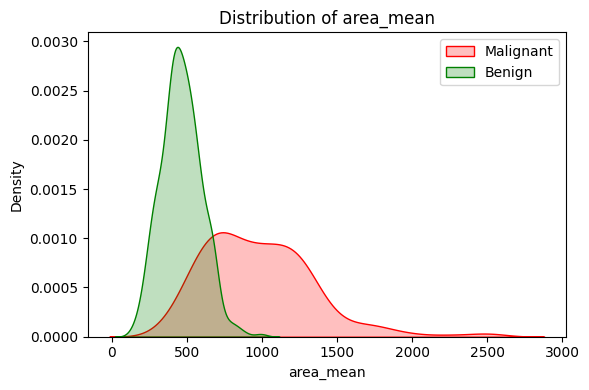

<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


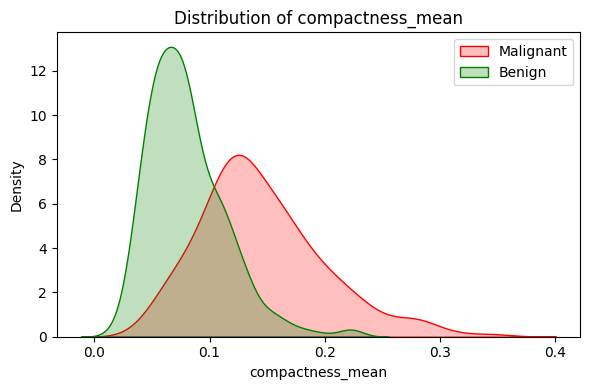

<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


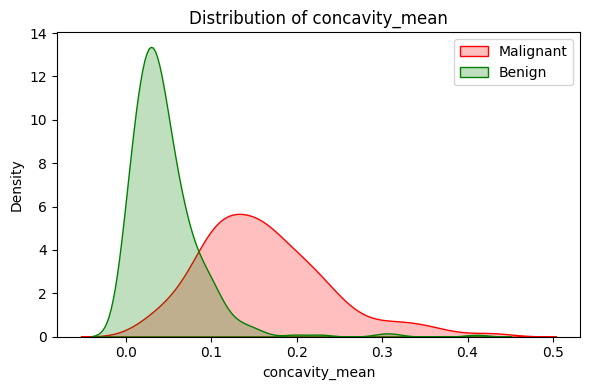

<ipython-input-12-0603055fd99c>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
<ipython-input-12-0603055fd99c>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')


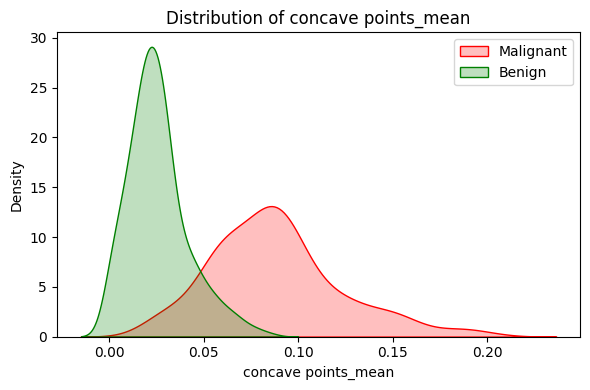

In [12]:
geometric_features = [
    'radius_mean', 'perimeter_mean', 'area_mean',
    'compactness_mean', 'concavity_mean', 'concave points_mean'
]

# Plot distributions of geometric features by diagnosis
for feature in geometric_features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(malignant[feature], label='Malignant', shade=True, color='red')
    sns.kdeplot(benign[feature], label='Benign', shade=True, color='green')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.legend()
    plt.tight_layout()
    plt.show()


<ipython-input-13-142014eaea7c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='diagnosis', y=feature, data=df, palette='Set2')
<ipython-input-13-142014eaea7c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='diagnosis', y=feature, data=df, palette='Set2')
<ipython-input-13-142014eaea7c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='diagnosis', y=feature, data=df, palette='Set2')
<ipython-input-13-142014eaea7c>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the 

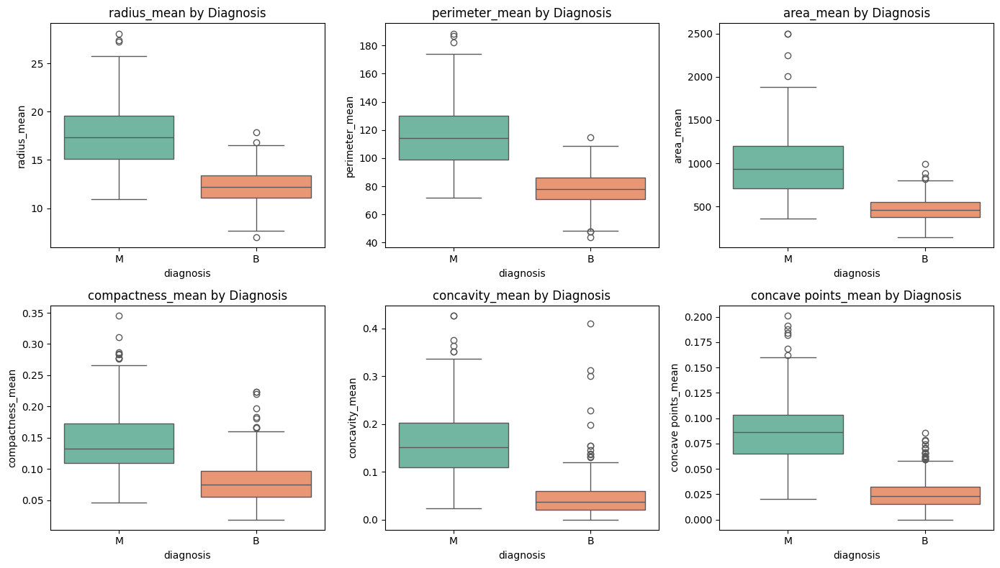

In [13]:
plt.figure(figsize=(14, 8))
for i, feature in enumerate(geometric_features):
    plt.subplot(2, 3, i+1)
    sns.boxplot(x='diagnosis', y=feature, data=df, palette='Set2')
    plt.title(f'{feature} by Diagnosis')
plt.tight_layout()
plt.show()


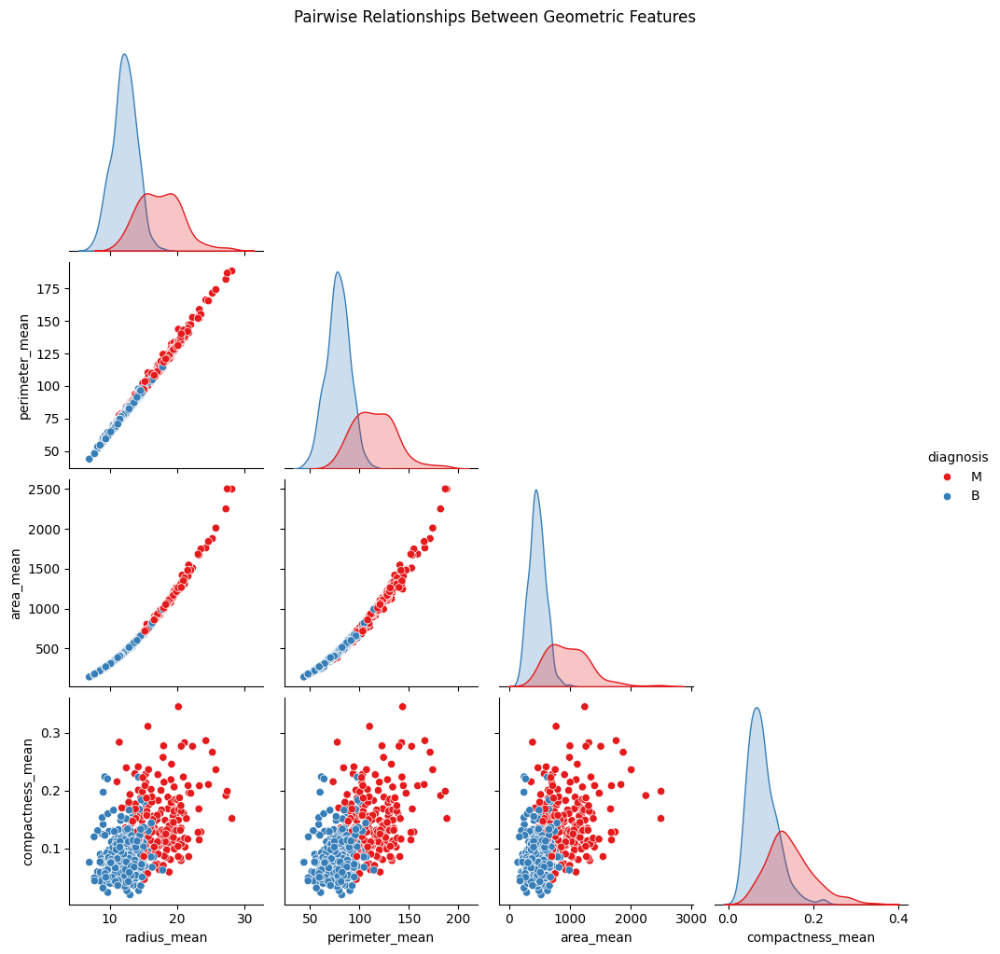

In [14]:
# Pairplot to observe multivariate separation between classes
sns.pairplot(df, vars=geometric_features[:4], hue='diagnosis', palette='Set1', corner=True)
plt.suptitle("Pairwise Relationships Between Geometric Features", y=1.02)
plt.show()


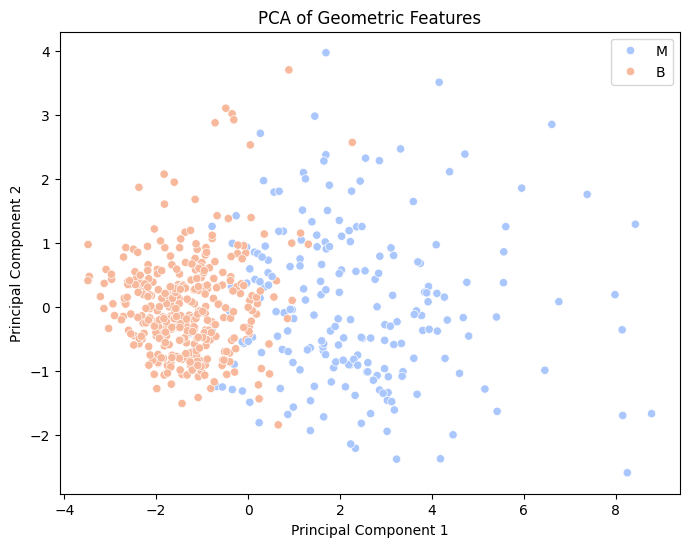

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Standardize geometric features
X = df[geometric_features]
X_scaled = StandardScaler().fit_transform(X)

# Apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['diagnosis'] = df['diagnosis']

# Plot PCA components
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='diagnosis', palette='coolwarm')
plt.title('PCA of Geometric Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


In [16]:
from scipy.stats import ttest_ind

# Run t-tests for each geometric feature
print("T-test Results:")
for feature in geometric_features:
    stat, p = ttest_ind(malignant[feature], benign[feature])
    print(f"{feature}: t-stat = {stat:.4f}, p-value = {p:.4e}")


T-test Results:
radius_mean: t-stat = 25.4358, p-value = 8.4659e-96
perimeter_mean: t-stat = 26.4052, p-value = 8.4363e-101
area_mean: t-stat = 23.9387, p-value = 4.7346e-88
compactness_mean: t-stat = 17.6984, p-value = 3.9383e-56
concavity_mean: t-stat = 23.1040, p-value = 9.9666e-84
concave points_mean: t-stat = 29.3543, p-value = 7.1012e-116


diagnosis               1.000000
concave points_worst    0.793566
perimeter_worst         0.782914
concave points_mean     0.776614
radius_worst            0.776454
perimeter_mean          0.742636
area_worst              0.733825
radius_mean             0.730029
area_mean               0.708984
concavity_mean          0.696360
Name: diagnosis, dtype: float64
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
id                         0.039769
symmetry_se               -0.006522
texture_se                -0.008303
fractal_dimension_mean    -0.012838
smoothness_se             -0.067016
Unnamed: 32                     NaN
Name: diagnosis, dtype: float64


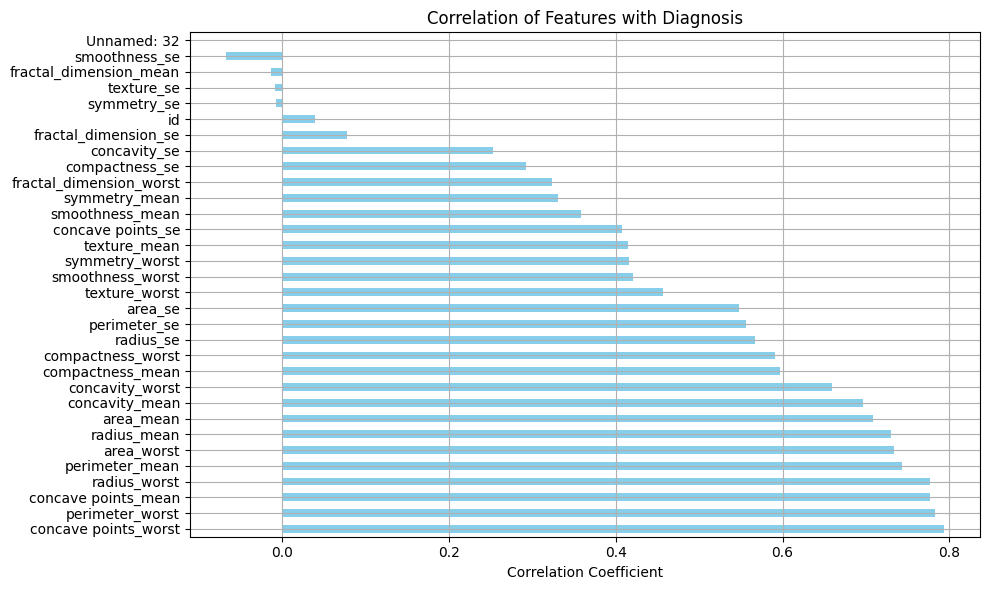

In [17]:
df_encoded = df.copy()
df_encoded['diagnosis'] = df_encoded['diagnosis'].map({'M': 1, 'B': 0})

# Correlation with target
correlations = df_encoded.corr()['diagnosis'].sort_values(ascending=False)
print(correlations.head(10))  # Most positively correlated
print(correlations.tail(10))  # Most negatively correlated

# Plot
plt.figure(figsize=(10,6))
correlations.drop('diagnosis').plot(kind='barh', color='skyblue')
plt.title('Correlation of Features with Diagnosis')
plt.xlabel('Correlation Coefficient')
plt.grid()
plt.tight_layout()
plt.show()


diagnosis    B    M
cluster            
0            7  162
1          350   50


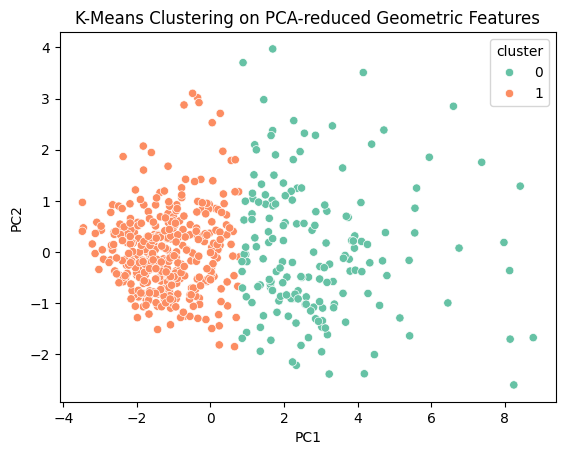

In [18]:
from sklearn.cluster import KMeans

# Use geometric features
X_geo = StandardScaler().fit_transform(df[geometric_features])

# KMeans with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X_geo)

# Add cluster labels
df['cluster'] = clusters

# Compare clusters with diagnosis
ct = pd.crosstab(df['cluster'], df['diagnosis'])
print(ct)

# Visualize cluster vs diagnosis
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=df['cluster'], palette='Set2')
plt.title("K-Means Clustering on PCA-reduced Geometric Features")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


In [23]:
# Drop empty or unnamed columns
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# OR explicitly drop Unnamed: 32
df = df.drop(columns=['Unnamed: 32'], errors='ignore')


In [24]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Recreate encoded dataframe and drop unused columns
df_encoded = df.copy()
df_encoded['diagnosis'] = df_encoded['diagnosis'].map({'M': 1, 'B': 0})

X = df_encoded.drop('diagnosis', axis=1)
y = df_encoded['diagnosis']

# RFE setup
model = LogisticRegression(max_iter=10000)
rfe = RFE(model, n_features_to_select=10)
fit = rfe.fit(X, y)

# ✅ Get selected features safely
selected_features = X.columns[fit.support_]
print("Top 10 Selected Features via RFE:")
print(selected_features)


Top 10 Selected Features via RFE:
Index(['radius_mean', 'concavity_mean', 'texture_se', 'radius_worst',
       'smoothness_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst', 'symmetry_worst', 'cluster'],
      dtype='object')


In [25]:
print(f"Number of columns in X: {X.shape[1]}")
print(f"Support mask length from RFE: {len(fit.support_)}")


Number of columns in X: 32
Support mask length from RFE: 32


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [28]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,cluster
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.702988
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.457344
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [30]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'cluster'],
      dtype='object')

In [32]:
# Check for null/missing values in the DataFrame
print(df.isnull().sum())

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
cluster                    0
dtype: int64


In [33]:
# Getting Mean Columns with diagnosis
m_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Getting Se Columns with diagnosis
s_col = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']

# Getting Worst column with diagnosis
w_col = ['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

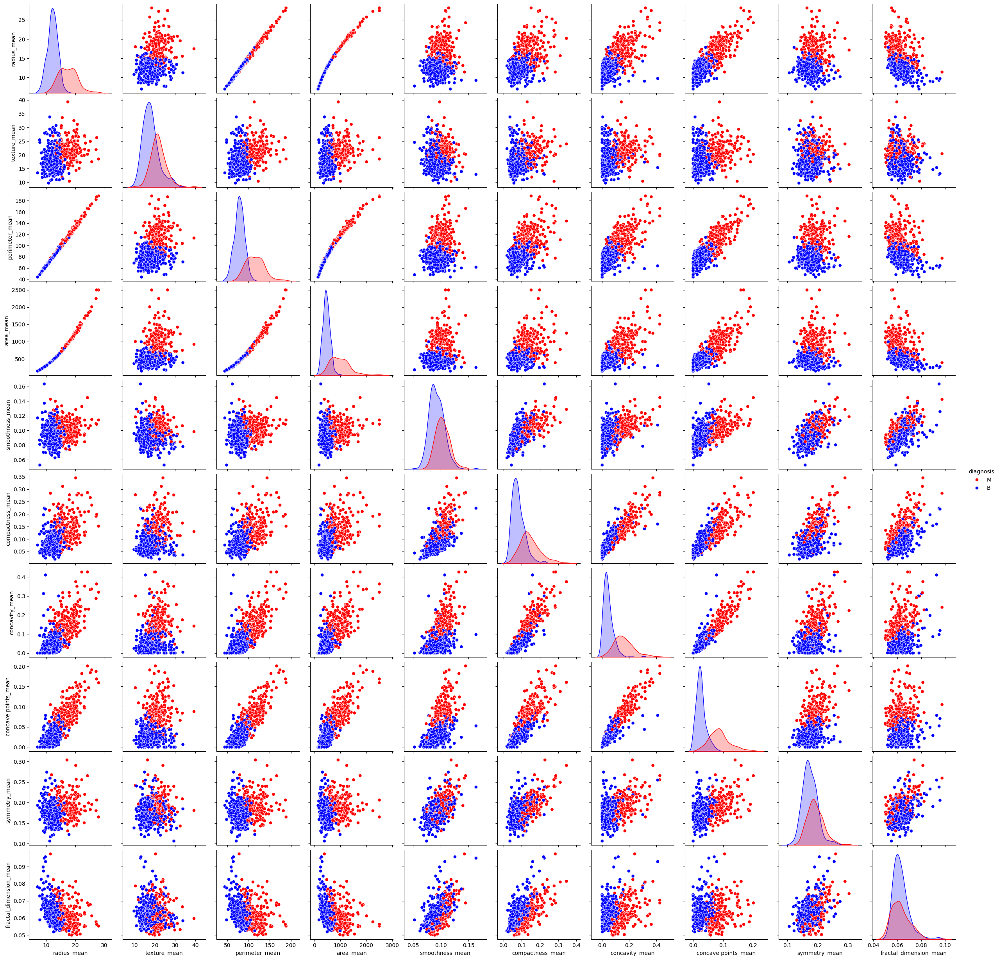

In [36]:
# pairplot for mean columns
# Change the palette from a single color name 'red' to a list of colors or a valid palette name
sns.pairplot(df[m_col],hue = 'diagnosis', palette=['red', 'blue'])

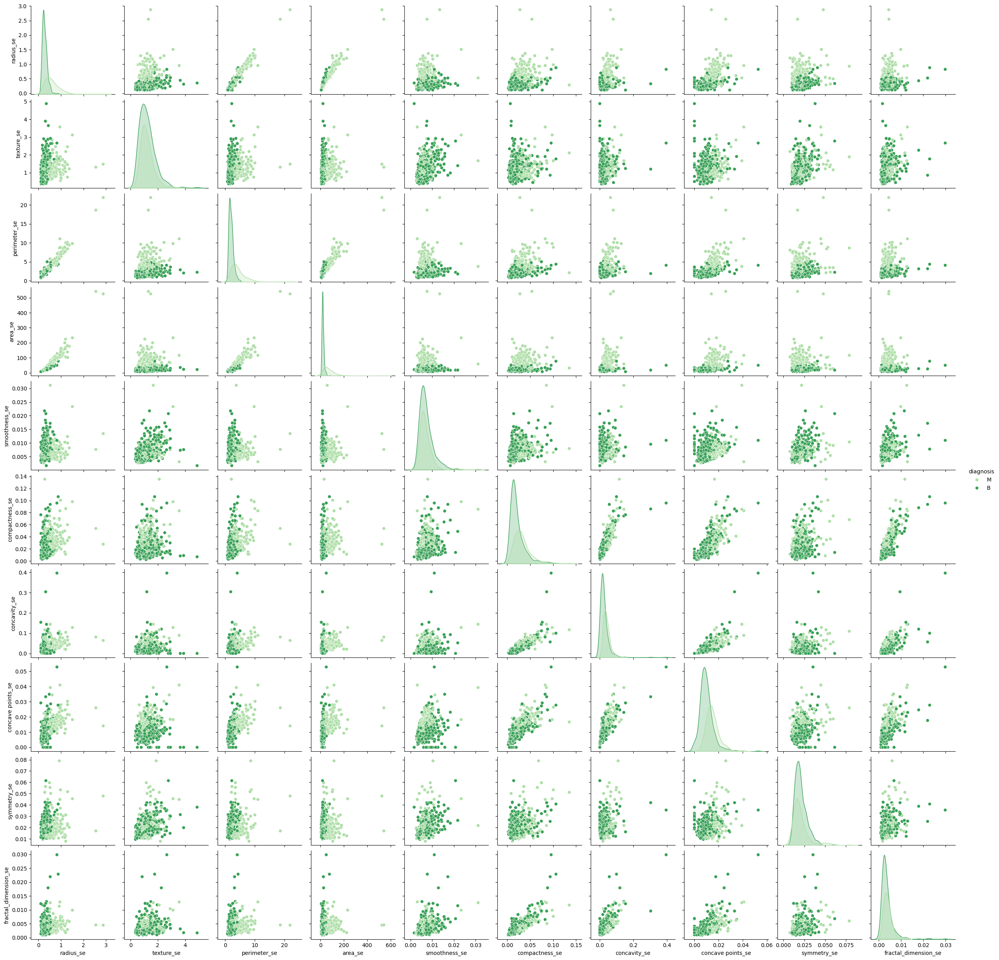

In [37]:
# pairplot for se columns
sns.pairplot(df[s_col],hue = 'diagnosis', palette='Greens')

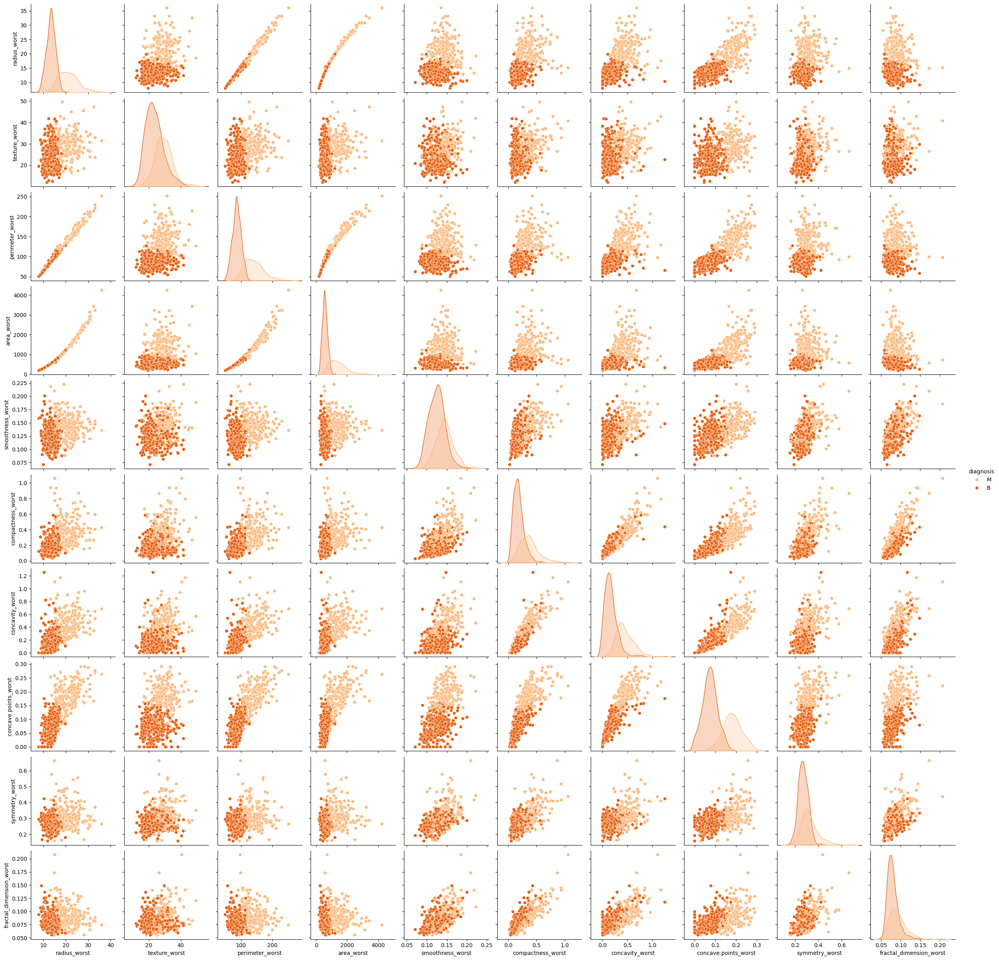

In [38]:
# pairplot for worst columns
sns.pairplot(df[w_col],hue = 'diagnosis', palette='Oranges')

In [39]:
from sklearn.model_selection import train_test_split

# splitting data
X_train, X_test, y_train, y_test = train_test_split(
                df.drop('diagnosis', axis=1),
                df['diagnosis'],
                test_size=0.2,
                random_state=42)

print("Shape of training set:", X_train.shape)
print("Shape of test set:", X_test.shape)

Shape of training set: (455, 32)
Shape of test set: (114, 32)


In [40]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.fit_transform(X_test)

In [41]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train, y_train)
predictions1 = logreg.predict(X_test)

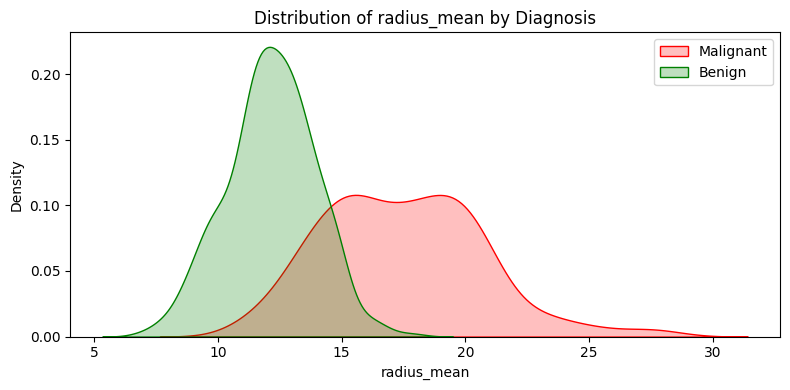

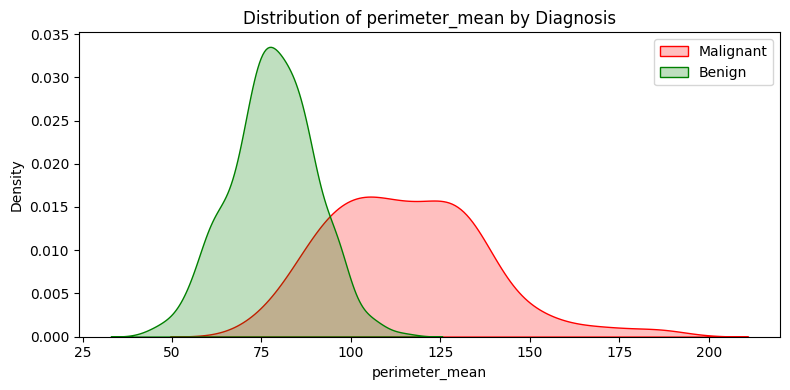

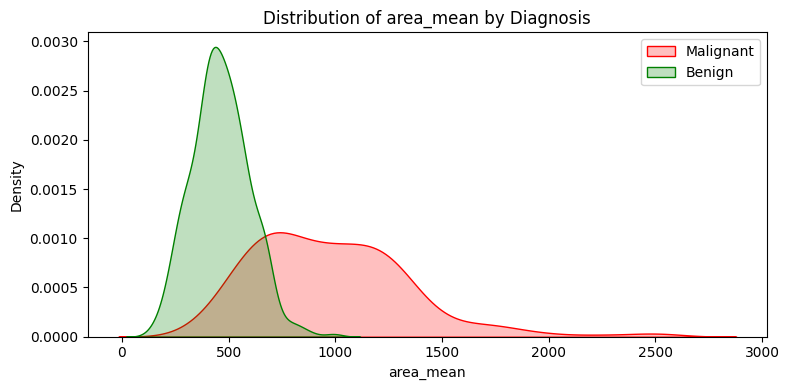

In [43]:
features_to_plot = ['radius_mean', 'perimeter_mean', 'area_mean']

for feature in features_to_plot:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=malignant, x=feature, fill=True, label='Malignant', color='red')
    sns.kdeplot(data=benign, x=feature, fill=True, label='Benign', color='green')
    plt.title(f'Distribution of {feature} by Diagnosis')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()


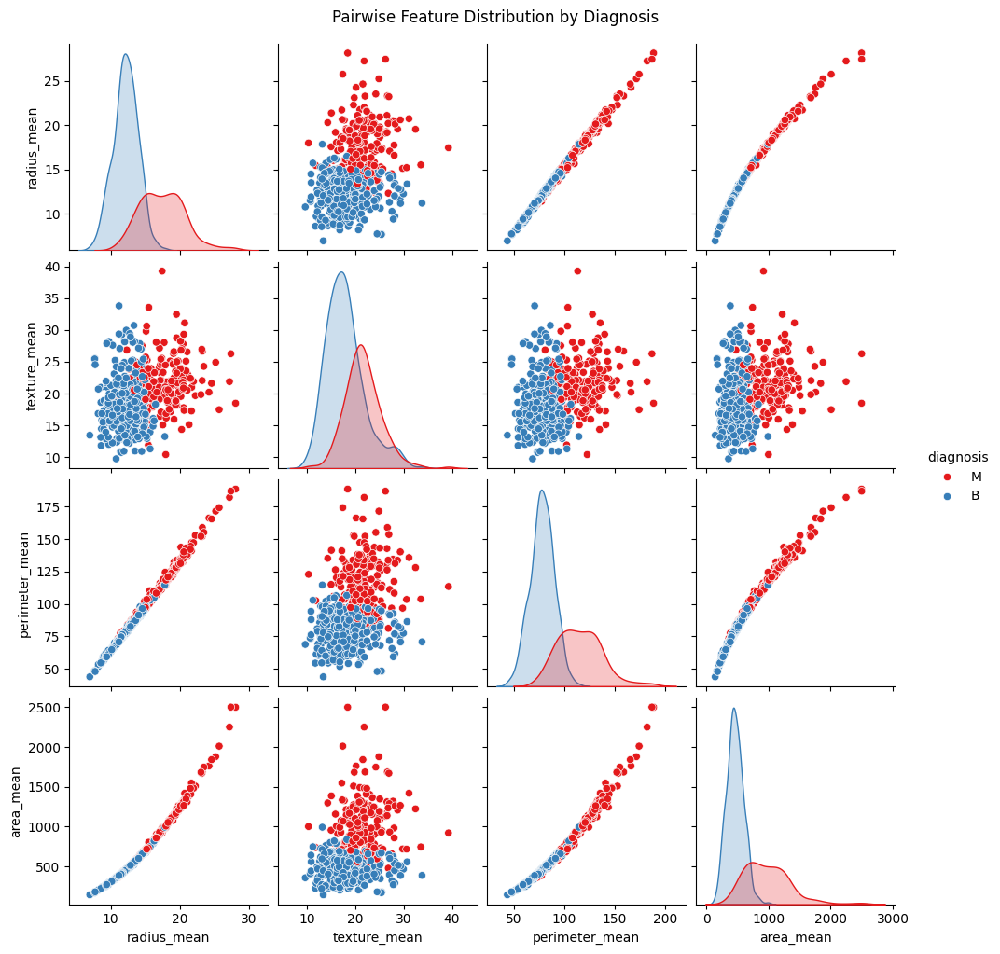

In [44]:
selected = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'diagnosis']
sns.pairplot(df[selected], hue='diagnosis', palette='Set1', diag_kind='kde')
plt.suptitle("Pairwise Feature Distribution by Diagnosis", y=1.02)
plt.show()


<ipython-input-45-f7a54f76ef0a>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='diagnosis', y='area_mean', data=df, palette='coolwarm')


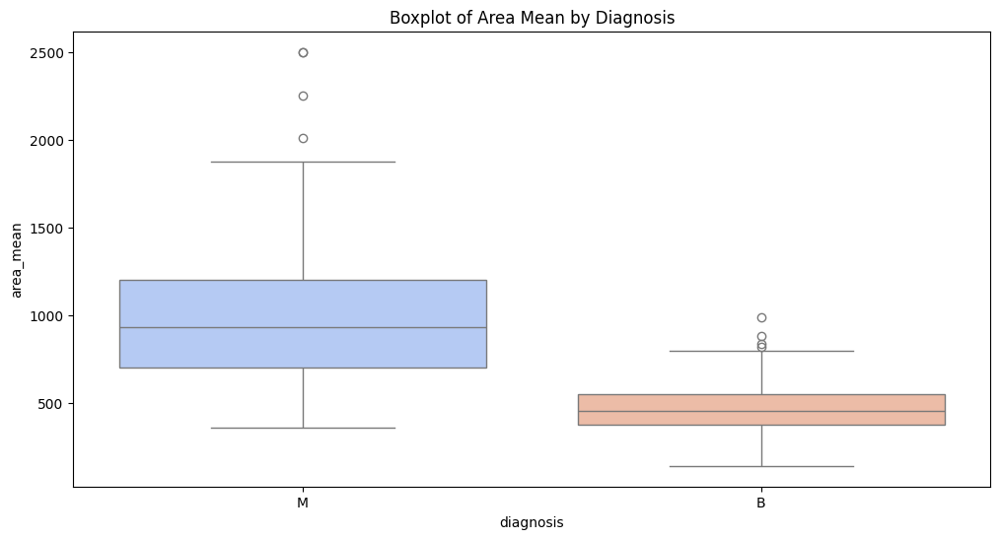

In [45]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='diagnosis', y='area_mean', data=df, palette='coolwarm')
plt.title("Boxplot of Area Mean by Diagnosis")
plt.show()

# You can repeat for other features


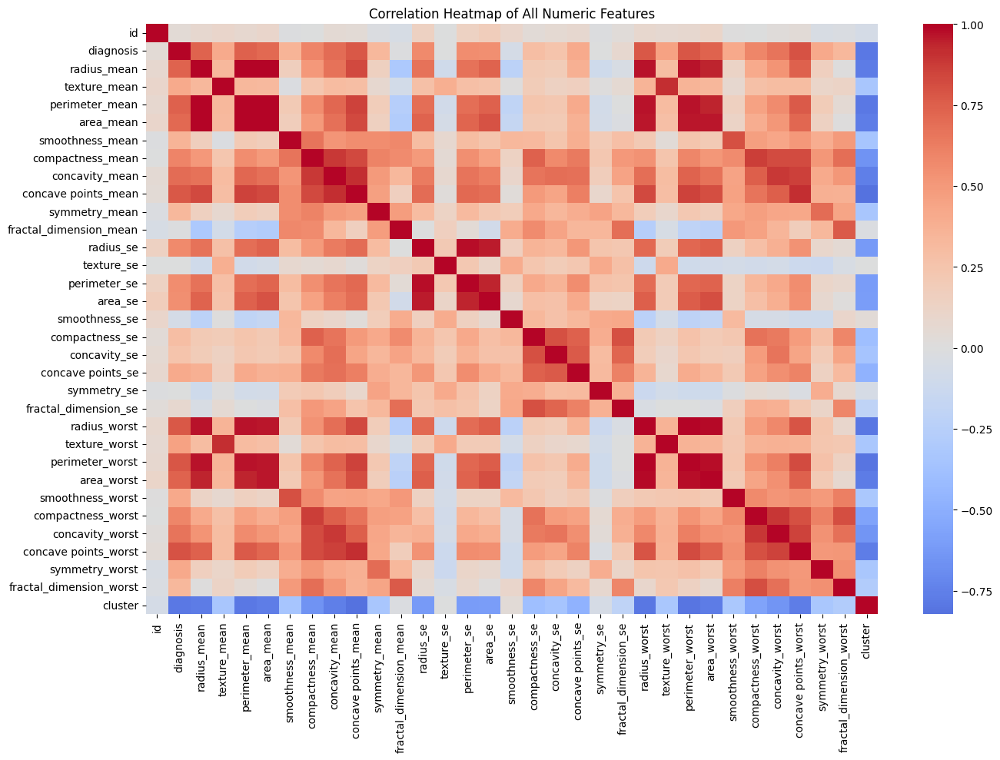

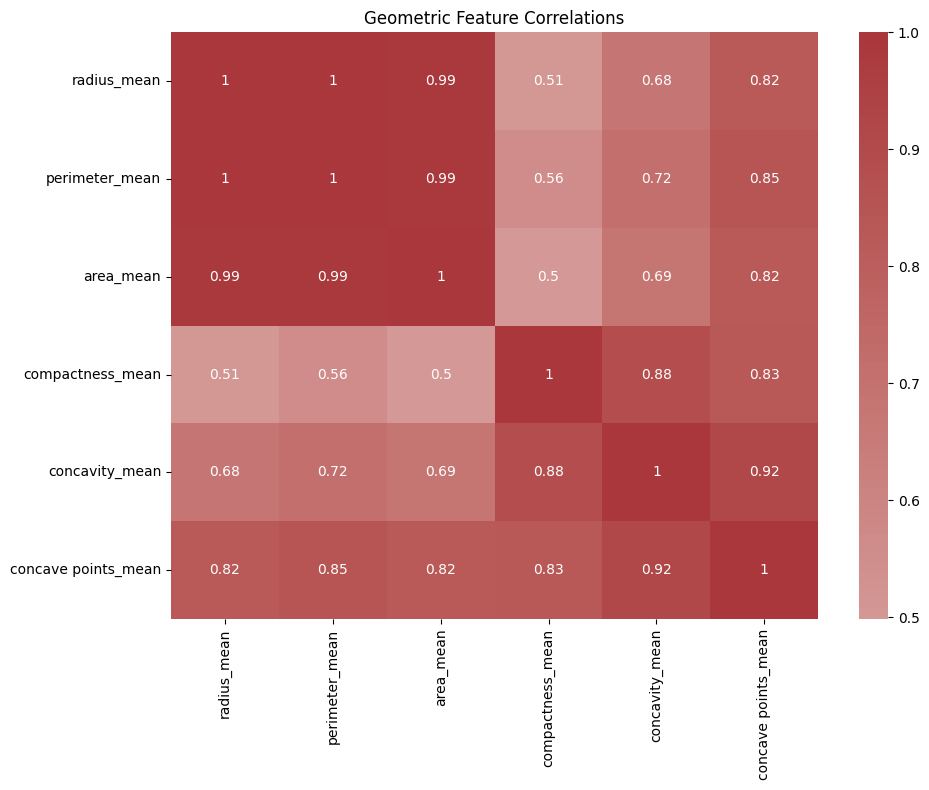

In [47]:
# Full correlation
plt.figure(figsize=(14, 10))

# Create a copy to avoid modifying the original df if it's used elsewhere with string diagnosis
df_numeric_corr = df.copy()
# Convert 'diagnosis' to numeric (1 for 'M', 0 for 'B')
df_numeric_corr['diagnosis'] = df_numeric_corr['diagnosis'].map({'M': 1, 'B': 0})

# Now calculate correlation on the DataFrame with numeric diagnosis
sns.heatmap(df_numeric_corr.corr(numeric_only=True), cmap='coolwarm', center=0, annot=False)
plt.title("Correlation Heatmap of All Numeric Features")
plt.tight_layout()
plt.show()

# Geometric feature correlation only (already contains numeric features, no change needed)
plt.figure(figsize=(10, 8))
sns.heatmap(df[geometric_features].corr(), annot=True, cmap='vlag', center=0)
plt.title("Geometric Feature Correlations")
plt.tight_layout()
plt.show()

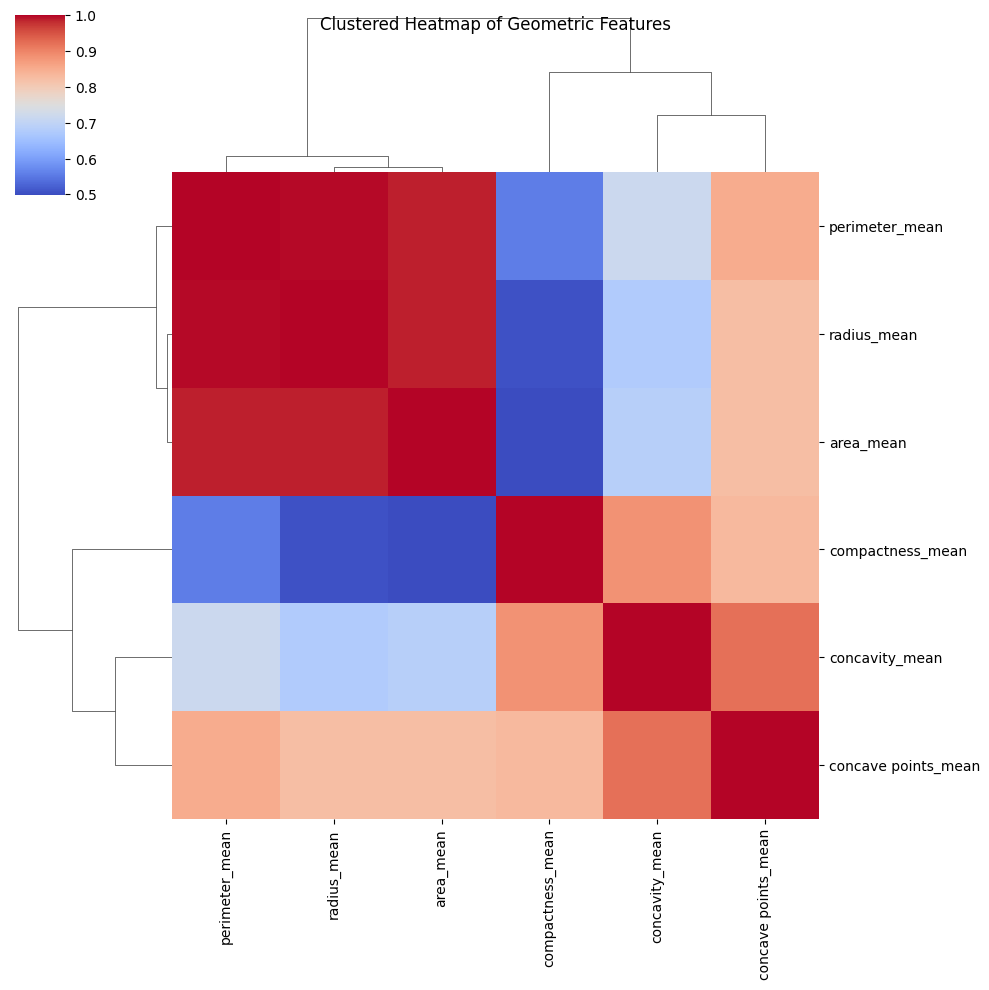

In [48]:
sns.clustermap(df[geometric_features].corr(), cmap='coolwarm', figsize=(10, 10))
plt.suptitle("Clustered Heatmap of Geometric Features")
plt.show()


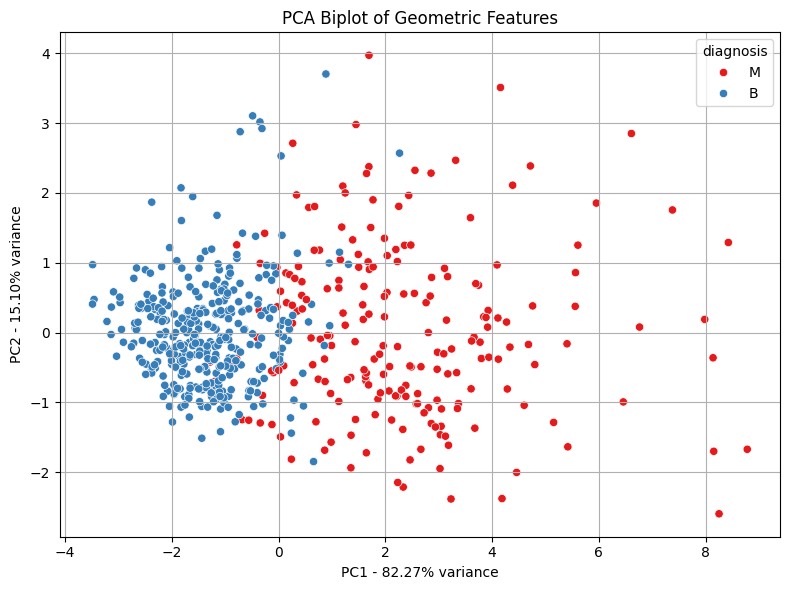

In [49]:
from sklearn.decomposition import PCA

X_std = StandardScaler().fit_transform(df[geometric_features])
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

# Biplot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df['diagnosis'], palette='Set1')
plt.xlabel(f"PC1 - {pca.explained_variance_ratio_[0]:.2%} variance")
plt.ylabel(f"PC2 - {pca.explained_variance_ratio_[1]:.2%} variance")
plt.title("PCA Biplot of Geometric Features")
plt.grid()
plt.tight_layout()
plt.show()


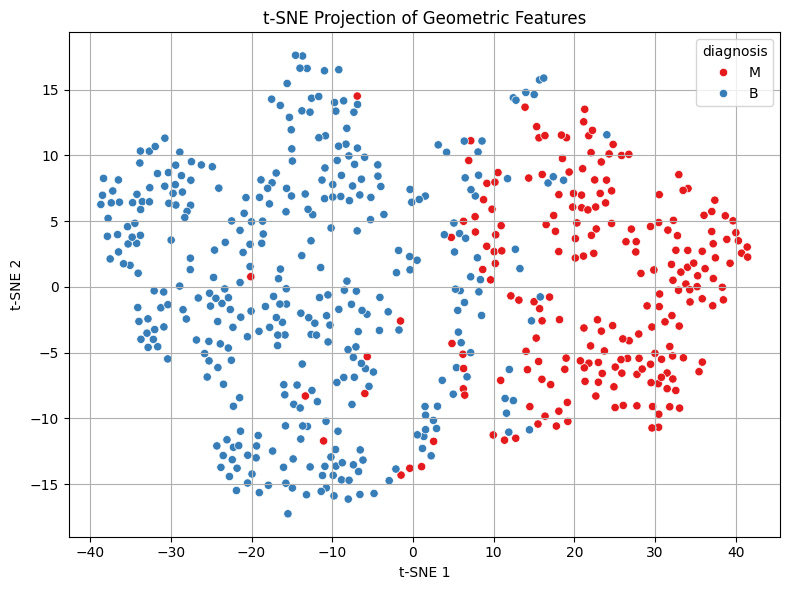

In [50]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_std)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df['diagnosis'], palette='Set1')
plt.title("t-SNE Projection of Geometric Features")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid()
plt.tight_layout()
plt.show()


In [51]:
# Outlier detection using IQR for one feature
Q1 = df['area_mean'].quantile(0.25)
Q3 = df['area_mean'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['area_mean'] < (Q1 - 1.5 * IQR)) | (df['area_mean'] > (Q3 + 1.5 * IQR))]

print(f"Outliers in 'area_mean': {len(outliers)}")


Outliers in 'area_mean': 25


In [52]:
# Drop ID column if present
df = df.drop(columns=['id', 'Unnamed: 32'], errors='ignore')


In [53]:
# Map M -> 1, B -> 0
df['diagnosis'] = df['diagnosis'].map({'M': 1, 'B': 0})


In [54]:
df['compactness_ratio'] = df['perimeter_mean'] / df['radius_mean']
df['density'] = df['area_mean'] / (df['radius_mean'] ** 2)


In [55]:
from sklearn.preprocessing import StandardScaler

X = df.drop('diagnosis', axis=1)
y = df['diagnosis']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [56]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)


In [57]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

logreg = LogisticRegression(max_iter=5000)
logreg.fit(X_train, y_train)
y_pred_log = logreg.predict(X_test)

print("🔹 Logistic Regression Results:")
print(confusion_matrix(y_test, y_pred_log))
print(classification_report(y_test, y_pred_log))


🔹 Logistic Regression Results:
[[71  1]
 [ 2 40]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        72
           1       0.98      0.95      0.96        42

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [58]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("🔹 Random Forest Results:")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))


🔹 Random Forest Results:
[[72  0]
 [ 3 39]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        72
           1       1.00      0.93      0.96        42

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114



In [59]:
from sklearn.svm import SVC

svc = SVC(kernel='rbf', probability=True)
svc.fit(X_train, y_train)
y_pred_svm = svc.predict(X_test)

print("🔹 SVM Results:")
print(confusion_matrix(y_test, y_pred_svm))
print(classification_report(y_test, y_pred_svm))


🔹 SVM Results:
[[71  1]
 [ 4 38]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97        72
           1       0.97      0.90      0.94        42

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



In [60]:
# Uncomment if xgboost is installed
# !pip install xgboost

from xgboost import XGBClassifier

xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

print("🔹 XGBoost Results:")
print(confusion_matrix(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [08:28:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


🔹 XGBoost Results:
[[72  0]
 [ 4 38]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        72
           1       1.00      0.90      0.95        42

    accuracy                           0.96       114
   macro avg       0.97      0.95      0.96       114
weighted avg       0.97      0.96      0.96       114



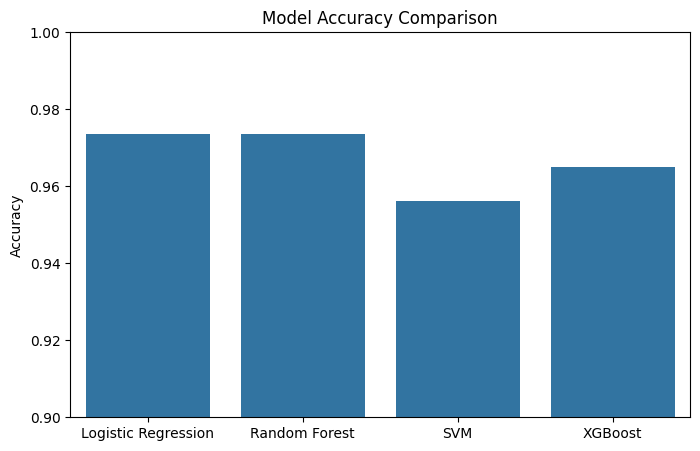

In [61]:
from sklearn.metrics import accuracy_score

models = ['Logistic Regression', 'Random Forest', 'SVM', 'XGBoost']
accuracies = [
    accuracy_score(y_test, y_pred_log),
    accuracy_score(y_test, y_pred_rf),
    accuracy_score(y_test, y_pred_svm),
    accuracy_score(y_test, y_pred_xgb)
]

plt.figure(figsize=(8, 5))
sns.barplot(x=models, y=accuracies)
plt.ylim(0.9, 1.0)
plt.title("Model Accuracy Comparison")
plt.ylabel("Accuracy")
plt.show()


In [62]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define parameter grid
param_grid_lr = {
    'C': [0.01, 0.1, 1, 10, 100],     # Regularization strength
    'penalty': ['l1', 'l2'],          # Type of regularization
    'solver': ['liblinear']           # 'liblinear' supports l1 and l2
}

# Set up grid search
grid_lr = GridSearchCV(LogisticRegression(max_iter=5000), param_grid_lr, cv=5, scoring='accuracy')
grid_lr.fit(X_train, y_train)

# Best params and score
print("🔹 Best Logistic Regression Parameters:", grid_lr.best_params_)
print("🔹 Best Logistic Regression Accuracy (CV):", grid_lr.best_score_)

# Evaluate on test set
y_pred_best_lr = grid_lr.predict(X_test)
print("\n🔹 Test Set Evaluation:")
print(confusion_matrix(y_test, y_pred_best_lr))
print(classification_report(y_test, y_pred_best_lr))


🔹 Best Logistic Regression Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
🔹 Best Logistic Regression Accuracy (CV): 0.9758241758241759

🔹 Test Set Evaluation:
[[70  2]
 [ 2 40]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        72
           1       0.95      0.95      0.95        42

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114



In [63]:
from sklearn.ensemble import RandomForestClassifier

# Define parameter grid
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [4, 6, 8, None],
    'min_samples_split': [2, 5, 10],
    'max_features': ['sqrt', 'log2']
}

# Set up grid search
grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, cv=5, scoring='accuracy')
grid_rf.fit(X_train, y_train)

# Best params and score
print("🔹 Best Random Forest Parameters:", grid_rf.best_params_)
print("🔹 Best Random Forest Accuracy (CV):", grid_rf.best_score_)

# Evaluate on test set
y_pred_best_rf = grid_rf.predict(X_test)
print("\n🔹 Test Set Evaluation:")
print(confusion_matrix(y_test, y_pred_best_rf))
print(classification_report(y_test, y_pred_best_rf))


🔹 Best Random Forest Parameters: {'max_depth': 6, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 100}
🔹 Best Random Forest Accuracy (CV): 0.9626373626373628

🔹 Test Set Evaluation:
[[71  1]
 [ 3 39]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        72
           1       0.97      0.93      0.95        42

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



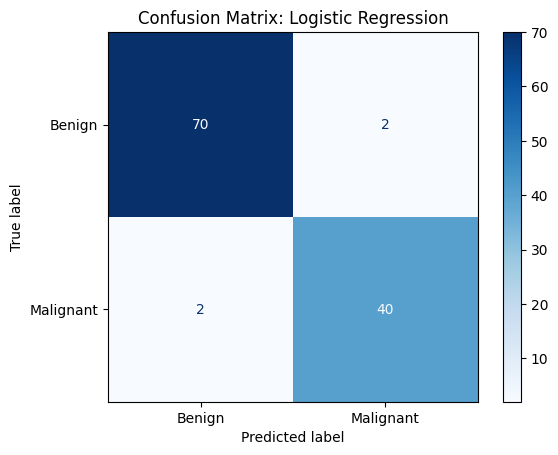

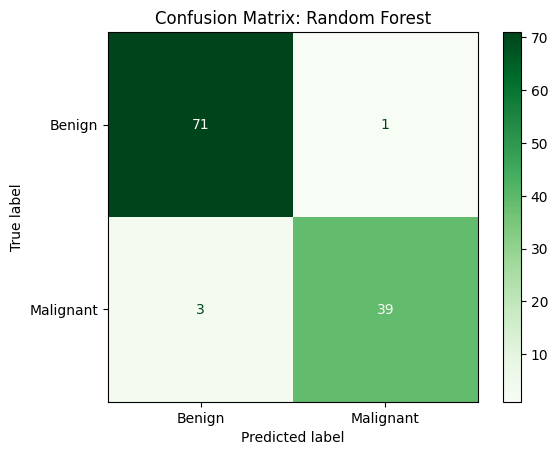

In [64]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Confusion matrix for best logistic regression
cm_lr = confusion_matrix(y_test, y_pred_best_lr)
disp_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=["Benign", "Malignant"])
disp_lr.plot(cmap="Blues")
plt.title("Confusion Matrix: Logistic Regression")
plt.show()

# Confusion matrix for best random forest
cm_rf = confusion_matrix(y_test, y_pred_best_rf)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=["Benign", "Malignant"])
disp_rf.plot(cmap="Greens")
plt.title("Confusion Matrix: Random Forest")
plt.show()


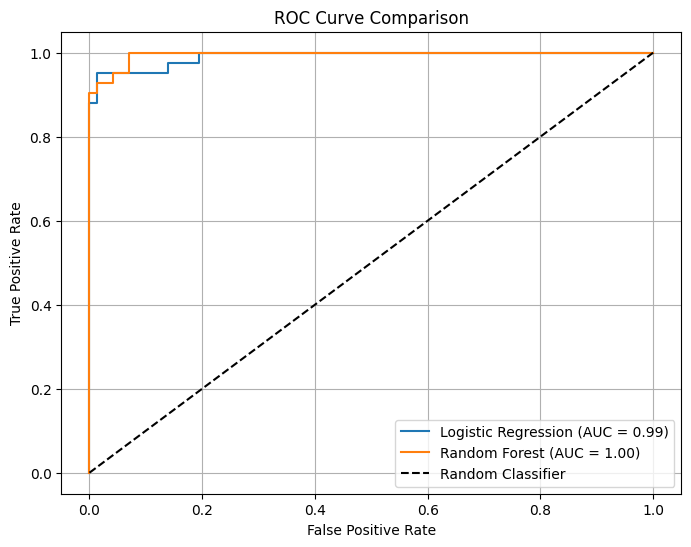

In [65]:
from sklearn.metrics import roc_curve, roc_auc_score

# Predict probabilities
y_score_lr = grid_lr.predict_proba(X_test)[:, 1]
y_score_rf = grid_rf.predict_proba(X_test)[:, 1]

# Compute ROC curve
fpr_lr, tpr_lr, _ = roc_curve(y_test, y_score_lr)
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_score_rf)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr_lr, tpr_lr, label=f"Logistic Regression (AUC = {roc_auc_score(y_test, y_score_lr):.2f})")
plt.plot(fpr_rf, tpr_rf, label=f"Random Forest (AUC = {roc_auc_score(y_test, y_score_rf):.2f})")
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.grid(True)
plt.show()


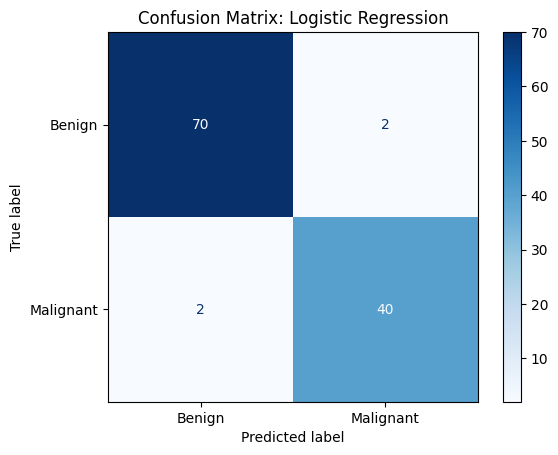

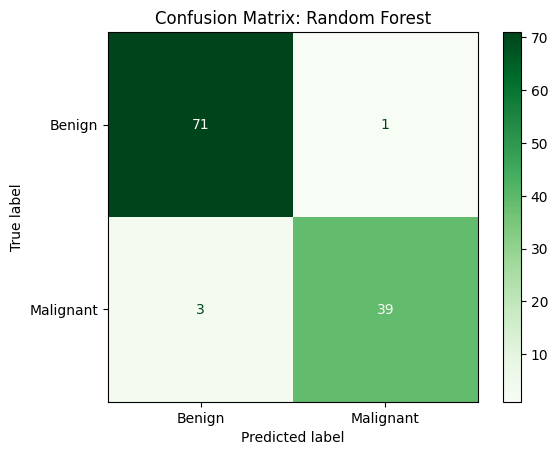

In [66]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Confusion matrix for best logistic regression
cm_lr = confusion_matrix(y_test, y_pred_best_lr)
disp_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=["Benign", "Malignant"])
disp_lr.plot(cmap="Blues")
plt.title("Confusion Matrix: Logistic Regression")
plt.show()

# Confusion matrix for best random forest
cm_rf = confusion_matrix(y_test, y_pred_best_rf)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=["Benign", "Malignant"])
disp_rf.plot(cmap="Greens")
plt.title("Confusion Matrix: Random Forest")
plt.show()
